In [1]:
import pandas as pd 
import numpy as np 
import os
import matplotlib.pyplot as plt 
import seaborn as sns

In [2]:
#! kaggle datasets download -d paultimothymooney/breast-histopathology-images

In [3]:
# import os 
# filename = 'breast-histopathology-images.zip'
# new_folder = 'dataset'

# if not os.path.exists(new_folder):
#     os.makedirs(new_folder)

# with ZipFile (filename,'r') as zip:
#     zip.printdir()
#     print("Extracting all files to '{}'...".format(new_folder))
#     zip.extractall(new_folder)
#     print("Done")

# Exploring the dataset

In [4]:
files = os.listdir('dataset')
print(len(files))
files[0:10]

280


['10253',
 '10254',
 '10255',
 '10256',
 '10257',
 '10258',
 '10259',
 '10260',
 '10261',
 '10262']

In [5]:
files = os.listdir('dataset/IDC_regular_ps50_idx5/')
files[0:10] 
print(len(files))

279


How many patients are there ?

In [6]:
base_path = 'dataset/IDC_regular_ps50_idx5/'
folder = os.listdir(base_path)
len(folder)

279

How many patches do we have in total ?

In [7]:
total_images = 0
for i in range(len(folder)):
    patient_id = folder[i]
    for c in [0,1]:
        patient_path = base_path + patient_id
        class_path = patient_path + "/" + str(c) + "/"
        subfiles = os.listdir(class_path)
        total_images += len(subfiles)
    
print(total_images)

277524


Storing image path,patient id and the target in a dataframe

In [8]:
data_list = []  

for i in range(len(folder)):
    patient_id = folder[i]
    patient_path = base_path + patient_id
    for c in [0, 1]:
        class_path = f"{patient_path}/{c}/"  
        subfiles = os.listdir(class_path)
        for image_path in subfiles:
            full_path = class_path + image_path  
            data_list.append({'patient_id': patient_id, 'path': full_path, 'target': c})

df = pd.DataFrame(data_list)

df


,patient_id,path,target
0,10253,dataset/IDC_regular_ps50_idx5/10253/0/10253_id...,0
1,10253,dataset/IDC_regular_ps50_idx5/10253/0/10253_id...,0
2,10253,dataset/IDC_regular_ps50_idx5/10253/0/10253_id...,0
3,10253,dataset/IDC_regular_ps50_idx5/10253/0/10253_id...,0
4,10253,dataset/IDC_regular_ps50_idx5/10253/0/10253_id...,0
...,...,...,...
277519,9383,dataset/IDC_regular_ps50_idx5/9383/1/9383_idx5...,1
277520,9383,dataset/IDC_regular_ps50_idx5/9383/1/9383_idx5...,1
277521,9383,dataset/IDC_regular_ps50_idx5/9383/1/9383_idx5...,1
277522,9383,dataset/IDC_regular_ps50_idx5/9383/1/9383_idx5...,1


In [9]:
df.shape

(277524, 3)

# EDA 

In [10]:
target_counts = df.groupby('patient_id')['target'].value_counts()
print(target_counts)

patient_id  target
10253       0          479
            1           70
10254       0          772
            1           76
10255       0          181
                      ... 
9381        1          128
9382        0         1306
            1          346
9383        0          494
            1           70
Name: count, Length: 558, dtype: int64


In [11]:
total_entries = df.groupby('patient_id')['target'].size()
print(total_entries)

patient_id
10253     549
10254     848
10255     272
10256     468
10257     635
         ... 
9346     1361
9347      410
9381     1326
9382     1652
9383      564
Name: target, Length: 279, dtype: int64


In [12]:
cancer_per_class = target_counts.div(total_entries,level='patient_id').unstack()
cancer_per_class

target,0,1
patient_id,,
10253,0.872495,0.127505
10254,0.910377,0.089623
10255,0.665441,0.334559
10256,0.750000,0.250000
10257,0.672441,0.327559
...,...,...
9346,0.465834,0.534166
9347,0.875610,0.124390
9381,0.903469,0.096531


C:\Users\rsurs\AppData\Local\Temp\ipykernel_18964\2817040280.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='target', data=df, palette="Set2", ax=ax[2])


Text(0.5, 1.0, 'How many patches show IDC?')

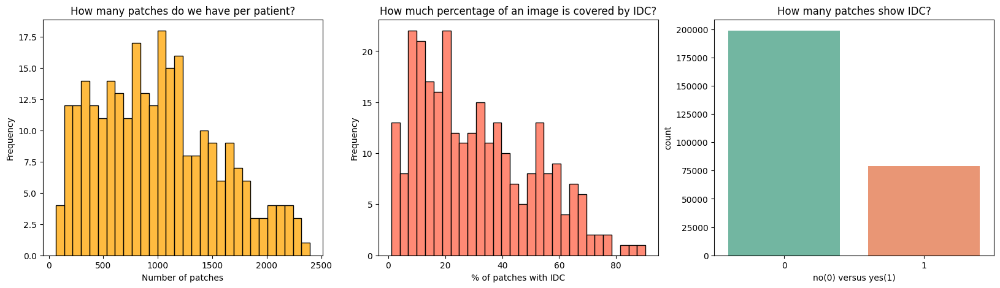

In [13]:
cancer_perc = df.groupby("patient_id").target.value_counts()/ df.groupby("patient_id").target.size()
cancer_perc = cancer_perc.unstack()

fig, ax = plt.subplots(1, 3, figsize=(20, 5))

sns.histplot(df.groupby("patient_id").size(), ax=ax[0], color="Orange", kde=False, bins=30)
ax[0].set_xlabel("Number of patches")
ax[0].set_ylabel("Frequency")
ax[0].set_title("How many patches do we have per patient?")

sns.histplot(cancer_perc.loc[:, 1] * 100, ax=ax[1], color="Tomato", kde=False, bins=30)
ax[1].set_title("How much percentage of an image is covered by IDC?")
ax[1].set_xlabel("% of patches with IDC")
ax[1].set_ylabel("Frequency")

sns.countplot(x='target', data=df, palette="Set2", ax=ax[2])
ax[2].set_xlabel("no(0) versus yes(1)")
ax[2].set_title("How many patches show IDC?")


- high variation in no of patches per patient
- A lot of patients indicate having IDC
- imbalanced when IDC vs no IDC 

Exploring healthy and cancerous patches

In [14]:
df['target'] = df['target'].astype(int)
df['target']

0         0
1         0
2         0
3         0
4         0
         ..
277519    1
277520    1
277521    1
277522    1
277523    1
Name: target, Length: 277524, dtype: int32

In [15]:
pos_selection =  np.random.choice(df[df['target']==1].index.values, size=50, replace=False)
print(pos_selection)
neg_selection =  np.random.choice(df[df['target']==0].index.values, size=50, replace=False)
print(neg_selection)

[276674  72434 124525 226490 273552 227882 222734  92368  90950   7869
 120431 157134 192303 134607 173855 226629 125783 244493  34328  97310
  42280 152952 147084  62636 214073 149877  92326 155675  81925 104748
 147091  82130  16999 133431 228250  70494 203789 212885  17103  43046
 177784  33142 193724 206137  16505  20891 178556 235326 183574 209132]
[164474  30347 228414  34019 202242  51941 153823 106941 212078 188018
 118551 248605 162983 186607  50518 143967 172412 136623 185964  13488
  25605  47376 163314  52274 270416 101792 201944 143346 163084 149122
   6350 168940  79339 277040  79593 193118 192006  80542  39684 207520
 149237  70815  32539 103136 250052 114834  95402 140921  83195  64885]


Plotting the cancerous patches 

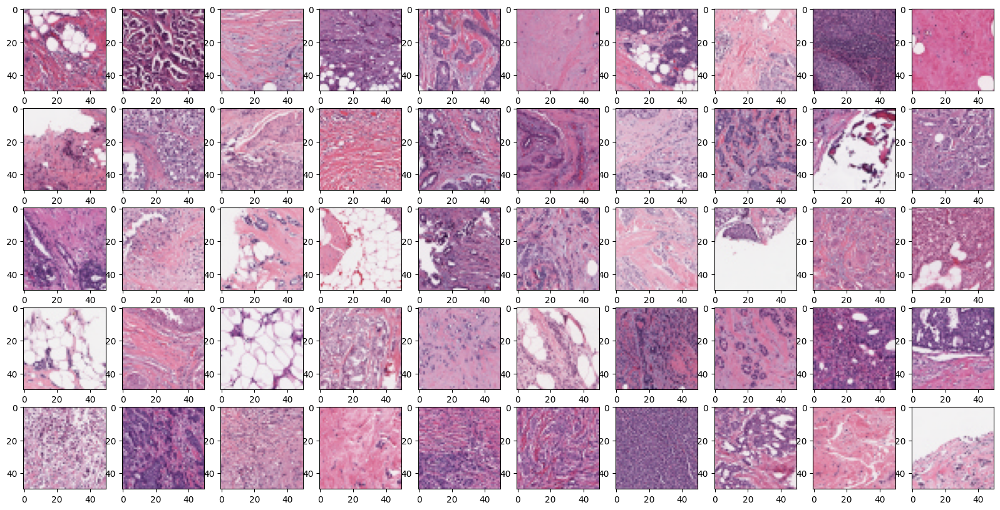

In [16]:
fig,ax = plt.subplots(5,10,figsize=(20,10))
for i in range(5):
    for j in range(10):
        idx = pos_selection[j + 10*i]
        image = plt.imread(df.loc[idx,'path'])
        ax[i,j].imshow(image)
        ax[i,j].grid(False)

Plotting healthy patches

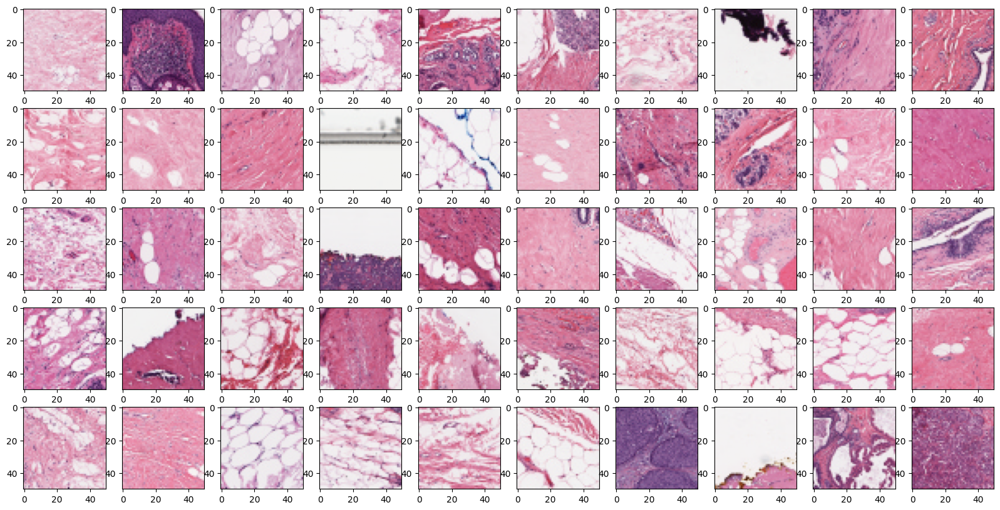

In [17]:
fig,ax = plt.subplots(5,10,figsize=(20,10))
for i in range(5):
    for j in range(10):
        idx = neg_selection[j + 10*i]
        image = plt.imread(df.loc[idx,'path'])
        ax[i,j].imshow(image)
        ax[i,j].grid(False)

- Incomplete patches have a smaller size
- Patches with cancer appear more violet and crowded than healthy ones


Visualizing the breast tissue

In [18]:
def extract_coords(df):
    coord = df.path.str.rsplit("_", n=4, expand=True)
    coord = coord.drop([0, 1, 4], axis=1)
    coord = coord.rename({2: "x", 3: "y"}, axis=1)
    coord.loc[:, "x"] = coord.loc[:,"x"].str.replace("x", "", case=False).astype(int)
    coord.loc[:, "y"] = coord.loc[:,"y"].str.replace("y", "", case=False).astype(int)
    df.loc[:, "x"] = coord.x.values
    df.loc[:, "y"] = coord.y.values
    return df

def get_cancer_dataframe(patient_id, cancer_id):
    path = base_path + patient_id + "/" + cancer_id
    files = os.listdir(path)
    dataframe = pd.DataFrame(files, columns=["filename"])
    path_names = path + "/" + dataframe.filename.values
    dataframe = dataframe.filename.str.rsplit("_", n=4, expand=True)
    dataframe.loc[:, "target"] = int(cancer_id)
    dataframe.loc[:, "path"] = path_names
    dataframe = dataframe.drop([0, 1, 4], axis=1)
    dataframe = dataframe.rename({2: "x", 3: "y"}, axis=1)
    dataframe.loc[:, "x"] = dataframe.loc[:,"x"].str.replace("x", "", case=False).astype(int)
    dataframe.loc[:, "y"] = dataframe.loc[:,"y"].str.replace("y", "", case=False).astype(int)
    return dataframe

def get_patient_dataframe(patient_id):
    df_0 = get_cancer_dataframe(patient_id, "0")
    df_1 = get_cancer_dataframe(patient_id, "1")
    patient_df = pd.concat([df_0,df_1])
    return patient_df

In [19]:
example = get_patient_dataframe(df['patient_id'].values[0])
example.head()

,x,y,target,path
0,1001,1001,0,dataset/IDC_regular_ps50_idx5/10253/0/10253_id...
1,1001,1051,0,dataset/IDC_regular_ps50_idx5/10253/0/10253_id...
2,1001,1101,0,dataset/IDC_regular_ps50_idx5/10253/0/10253_id...
3,1001,1151,0,dataset/IDC_regular_ps50_idx5/10253/0/10253_id...
4,1001,1201,0,dataset/IDC_regular_ps50_idx5/10253/0/10253_id...


Binary target visualization

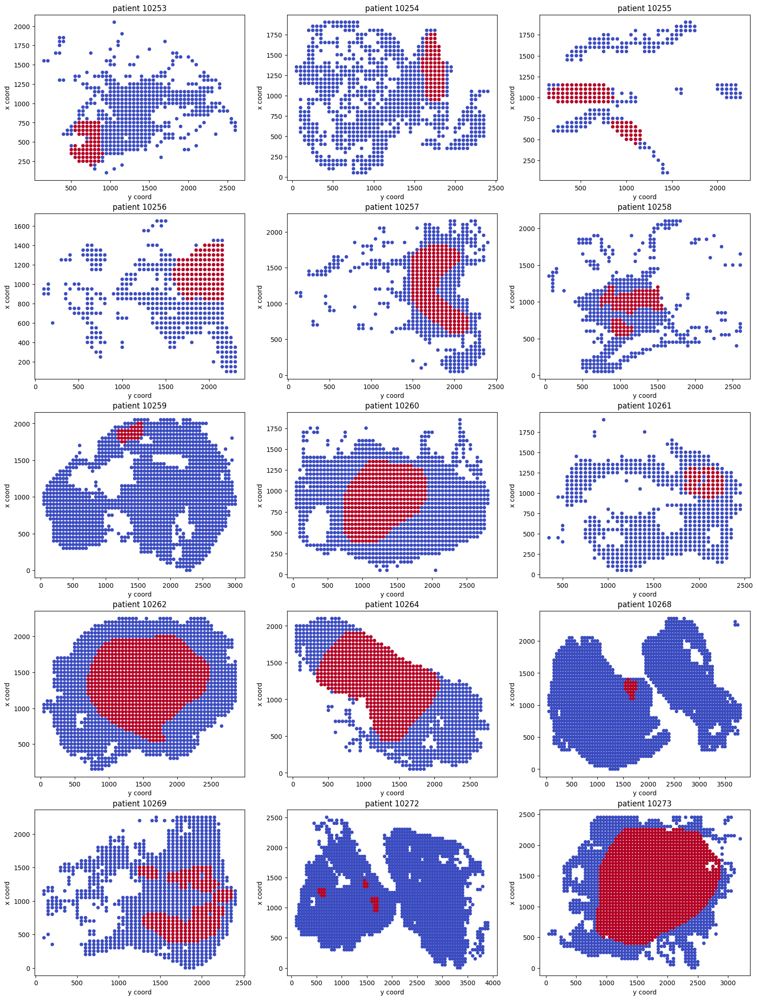

In [20]:
fig, ax = plt.subplots(5,3,figsize=(20, 27))

patient_ids = df.patient_id.unique()

for n in range(5):
    for m in range(3):
        patient_id = patient_ids[m + 3*n]
        example_df = get_patient_dataframe(patient_id)
        
        ax[n,m].scatter(example_df.x.values, example_df.y.values, c=example_df.target.values, cmap="coolwarm", s=20)
        ax[n,m].set_title("patient " + patient_id)
        ax[n,m].set_xlabel("y coord")
        ax[n,m].set_ylabel("x coord")

Visualizing the breast tissues 

In [66]:
from skimage.io import imread
def visualise_breast_tissue(patient_id, pred_df=None):
    example_df = get_patient_dataframe(patient_id)
    max_point = [example_df.y.max()-1, example_df.x.max()-1]
    grid = 255*np.ones(shape = (max_point[0] + 50, max_point[1] + 50, 3)).astype(np.uint8)
    mask = 255*np.ones(shape = (max_point[0] + 50, max_point[1] + 50, 3)).astype(np.uint8)
    if pred_df is not None:
        patient_df = pred_df[pred_df.patient_id == patient_id].copy()
    mask_proba = np.zeros(shape = (max_point[0] + 50, max_point[1] + 50, 1)).astype(np.float_)
    
    broken_patches = []
    for n in range(len(example_df)):
        try:
            image = imread(example_df.path.values[n])
            
            target = example_df.target.values[n]
            
            x_coord = int(example_df.x.values[n])
            y_coord = int(example_df.y.values[n])
            x_start = x_coord - 1 #pixel boundaries
            y_start = y_coord - 1
            x_end = x_start + 50
            y_end = y_start + 50

            grid[y_start:y_end, x_start:x_end] = image
            if target == 1:
                mask[y_start:y_end, x_start:x_end, 0] = 250
                mask[y_start:y_end, x_start:x_end, 1] = 0
                mask[y_start:y_end, x_start:x_end, 2] = 0
            if pred_df is not None:
                
                proba = patient_df[
                    (patient_df.x==x_coord) & (patient_df.y==y_coord)].proba
                mask_proba[y_start:y_end, x_start:x_end, 0] = float(proba.iloc[0])


        except ValueError:
            broken_patches.append(example_df.path.values[n])
    
    
    return grid, mask, broken_patches, mask_proba

Text(0.5, 1.0, 'Cancer tissue colored red \n of patient: 10273')

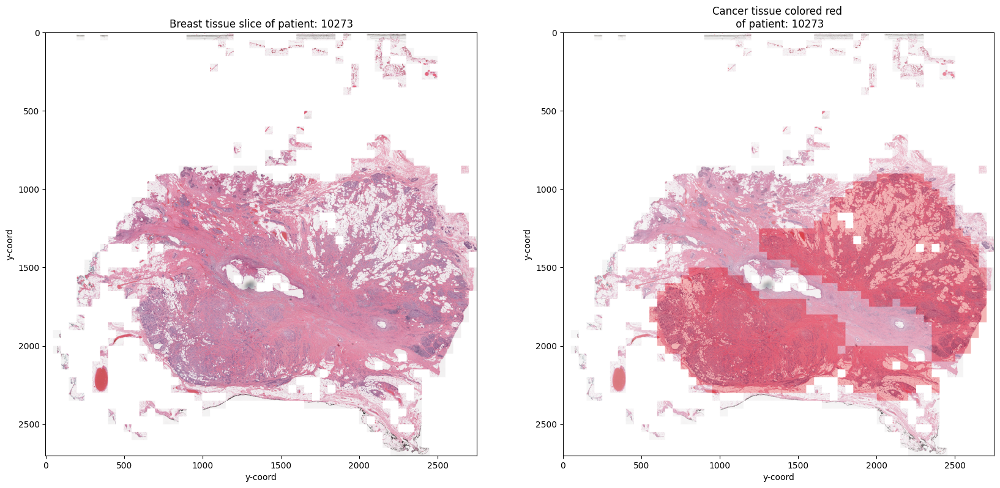

In [22]:
example = "13616"
grid, mask, broken_patches,_ = visualise_breast_tissue(example)

fig, ax = plt.subplots(1,2,figsize=(20,10))
ax[0].imshow(grid, alpha=0.9)
ax[1].imshow(mask, alpha=0.8)
ax[1].imshow(grid, alpha=0.7)
ax[0].grid(False)
ax[1].grid(False)
for m in range(2):
    ax[m].set_xlabel("y-coord")
    ax[m].set_ylabel("y-coord")
ax[0].set_title("Breast tissue slice of patient: " + patient_id)
ax[1].set_title("Cancer tissue colored red \n of patient: " + patient_id)

# ML Workflow  

In [23]:
BATCH_SIZE = 32 
NUM_CLASSES = 2 
OUTPUT_PATH = ''
MODEL_PATH = 'input/breastcancermodel/'
LOSSES_PATH = 'input/breastcancermodel/'

In [24]:
import torch 
from torch import nn 
import torchvision 
from torchvision import datasets,transforms,models 
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset,DataLoader
from PIL import Image

In [25]:
torch.manual_seed(0)
np.random.seed(0)

Validation set 

In [26]:
df.head()
df['target'] = df['target'].astype(np.str_)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 277524 entries, 0 to 277523
Data columns (total 3 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   patient_id  277524 non-null  object
 1   path        277524 non-null  object
 2   target      277524 non-null  object
dtypes: object(3)
memory usage: 6.4+ MB


In [27]:
patients = df['patient_id'].unique()
train_ids,sub_test_ids = train_test_split(patients,
                                          test_size=0.3,
                                          random_state=0)
test_ids,dev_ids = train_test_split(sub_test_ids,
                                        test_size=0.5,
                                        random_state=0)  


In [28]:
print(len(train_ids)/patients.shape[0]*100, len(dev_ids)/patients.shape[0]*100, len(test_ids)/patients.shape[0]*100)
print(len(train_ids), len(dev_ids), len(test_ids))

69.89247311827957 15.053763440860216 15.053763440860216
195 42 42


In [29]:
train_df = df.loc[df['patient_id'].isin(train_ids),:].copy()
test_df = df.loc[df['patient_id'].isin(test_ids),:].copy()
dev_df = df.loc[df['patient_id'].isin(dev_ids),:].copy()

train_df = extract_coords(train_df)
test_df = extract_coords(test_df)
dev_df = extract_coords(dev_df)

Target distrubutions 

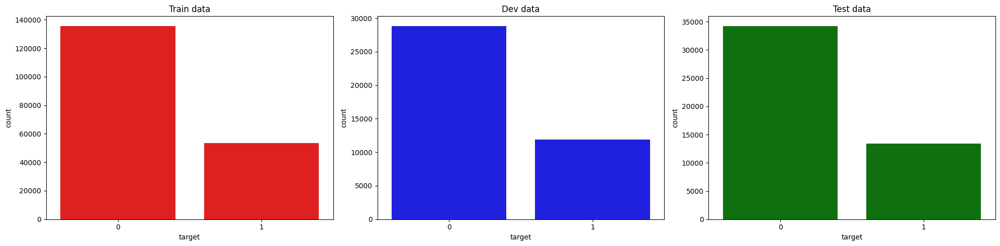

In [30]:
fig, ax = plt.subplots(1, 3, figsize=(20, 5))
sns.countplot(data=train_df, x='target', ax=ax[0], color="red") 
ax[0].set_title("Train data")
sns.countplot(data=dev_df, x='target', ax=ax[1], color="blue") 
ax[1].set_title("Dev data")
sns.countplot(data=test_df, x='target', ax=ax[2], color="green")
ax[2].set_title("Test data")
plt.tight_layout()  

Pytorch Image Datasets 

In [31]:
def my_transforms(key='train',plot=False):
    train_sequence = [transforms.Resize((50,50)),
                      transforms.RandomHorizontalFlip(),
                      transforms.RandomVerticalFlip()]
    val_sequence = [transforms.Resize((50,50))]
    if plot == False:
        train_sequence.extend([transforms.ToTensor(),
                               transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])])
        val_sequence.extend([transforms.ToTensor(),
                             transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])])
    
    data_transforms = {'train':transforms.Compose(train_sequence),'val':transforms.Compose(val_sequence)}
    return data_transforms[key]

In [32]:
class BCDataset(Dataset):
    
    def __init__(self, df, transform=None):
        self.states = df
        self.transform=transform
      
    def __len__(self):
        return len(self.states)
        
    def __getitem__(self, idx):
        patient_id = self.states.patient_id.values[idx]
        x_coord = self.states.x.values[idx]
        y_coord = self.states.y.values[idx]
        image_path = self.states.path.values[idx] 
        image = Image.open(image_path)
        image = image.convert('RGB')
        
        if self.transform:
            image = self.transform(image)
        
        if "target" in self.states.columns.values:
            target = int(self.states.target.values[idx])
        else:
            target = None
            
        return {"image": image,
                "label": target,
                "patient_id": patient_id,
                "x": x_coord,
                "y": y_coord}

In [33]:
train_dataset = BCDataset(train_df, transform=my_transforms(key="train"))
dev_dataset = BCDataset(dev_df, transform=my_transforms(key="val"))
test_dataset = BCDataset(test_df, transform=my_transforms(key="val"))

In [34]:
image_datasets = {"train": train_dataset, "dev": dev_dataset, "test": test_dataset}
dataset_sizes = {x: len(image_datasets[x]) for x in ["train", "dev", "test"]}

Augmented data 

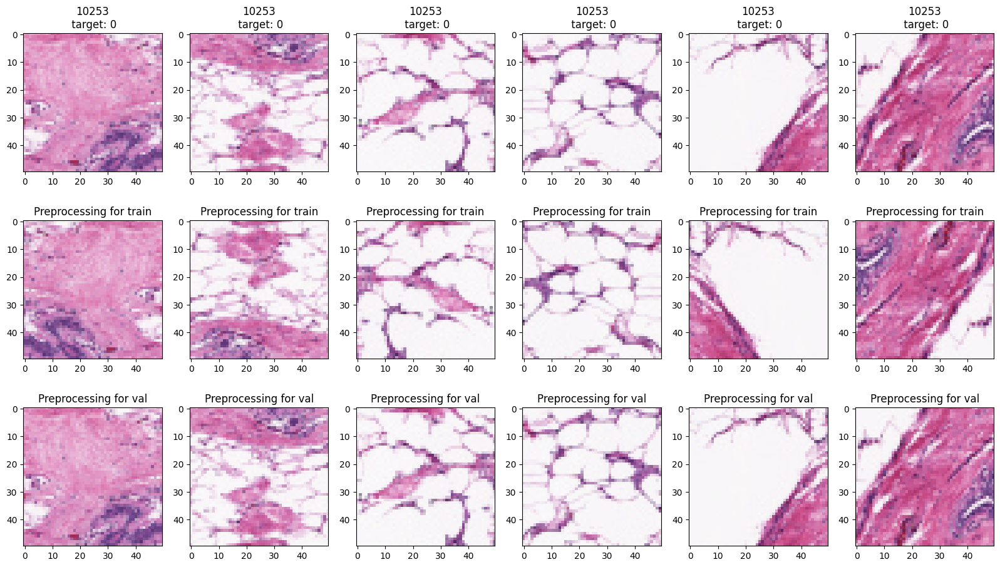

In [35]:
fig, ax = plt.subplots(3,6,figsize=(20,11))

train_transform = my_transforms(key="train", plot=True)
val_transform = my_transforms(key="val", plot=True)

for m in range(6):
    filepath = train_df.path.values[m]
    image = Image.open(filepath)
    ax[0,m].imshow(image)
    transformed_img = train_transform(image)
    ax[1,m].imshow(transformed_img)
    ax[2,m].imshow(val_transform(image))
    ax[0,m].grid(False)
    ax[1,m].grid(False)
    ax[2,m].grid(False)
    ax[0,m].set_title(train_df.patient_id.values[m] + "\n target: " + train_df.target.values[m])
    ax[1,m].set_title("Preprocessing for train")
    ax[2,m].set_title("Preprocessing for val")

In [36]:
train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)
dev_dataloader = DataLoader(dev_dataset, batch_size=BATCH_SIZE, shuffle=False, drop_last=True)
test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, drop_last=False)

In [37]:
dataloaders = {"train": train_dataloader, "dev": dev_dataloader, "test": test_dataloader}
print(len(dataloaders["train"]), len(dataloaders["dev"]), len(dataloaders["test"]))

5911 1273 1489


# Defining the model structure

In [38]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [39]:
run_training = False
retrain = False
find_learning_rate = False

In [40]:
from torchinfo import summary
model = models.resnet18(pretrained=False)
summary(model, input_size=(1, 3, 224, 224))


c:\Users\rsurs\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\rsurs\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Layer (type:depth-idx)                   Output Shape              Param #
ResNet                                   [1, 1000]                 --
├─Conv2d: 1-1                            [1, 64, 112, 112]         9,408
├─BatchNorm2d: 1-2                       [1, 64, 112, 112]         128
├─ReLU: 1-3                              [1, 64, 112, 112]         --
├─MaxPool2d: 1-4                         [1, 64, 56, 56]           --
├─Sequential: 1-5                        [1, 64, 56, 56]           --
│    └─BasicBlock: 2-1                   [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-1                  [1, 64, 56, 56]           36,864
│    │    └─BatchNorm2d: 3-2             [1, 64, 56, 56]           128
│    │    └─ReLU: 3-3                    [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-4                  [1, 64, 56, 56]           36,864
│    │    └─BatchNorm2d: 3-5             [1, 64, 56, 56]           128
│    │    └─ReLU: 3-6                    [1, 64, 56, 56]           --
│

In [41]:
if run_training: 
    model.load_state_dict(torch.load('input/pretrained-pytorch-models/resnet18-5c106cde.pth'))
num_features = model.fc.in_features
print(num_features)
model.fc = nn.Sequential(
    nn.Linear(num_features, 512),
    nn.ReLU(),
    nn.BatchNorm1d(512), #Train nn's to train faster by normalizing layers inputs 
    nn.Dropout(0.5),
    
    nn.Linear(512, 256),
    nn.ReLU(),
    nn.BatchNorm1d(256),
    nn.Dropout(0.5),
    
    nn.Linear(256, NUM_CLASSES))

def init_weights(m):
    if type(m) == nn.Linear:
        torch.nn.init.xavier_uniform_(m.weight) #keeps the scale of weights roughly the same in all layers and converges the nn faster 
        m.bias.data.fill_(0.01)

model.apply(init_weights)
model = model.to(device)
summary(model, input_size=(1, 3, 224, 224))


512


Layer (type:depth-idx)                   Output Shape              Param #
ResNet                                   [1, 2]                    --
├─Conv2d: 1-1                            [1, 64, 112, 112]         9,408
├─BatchNorm2d: 1-2                       [1, 64, 112, 112]         128
├─ReLU: 1-3                              [1, 64, 112, 112]         --
├─MaxPool2d: 1-4                         [1, 64, 56, 56]           --
├─Sequential: 1-5                        [1, 64, 56, 56]           --
│    └─BasicBlock: 2-1                   [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-1                  [1, 64, 56, 56]           36,864
│    │    └─BatchNorm2d: 3-2             [1, 64, 56, 56]           128
│    │    └─ReLU: 3-3                    [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-4                  [1, 64, 56, 56]           36,864
│    │    └─BatchNorm2d: 3-5             [1, 64, 56, 56]           128
│    │    └─ReLU: 3-6                    [1, 64, 56, 56]           --
│

# Loss function

Computing class weights

In [42]:
from sklearn.utils.class_weight import compute_class_weight #weight of less freq classes get higher wts 
weights = compute_class_weight(y=train_df['target'].values,class_weight="balanced", classes=train_df['target'].unique())
class_weights = torch.FloatTensor(weights)
if device == 'cuda':
    class_weights = class_weights.cuda()
print(class_weights)

tensor([0.6973, 1.7673], device='cuda:0')


In [43]:
train_df['target'].unique()

array(['0', '1'], dtype=object)

In [44]:
criterion = nn.CrossEntropyLoss(weight=class_weights)

Setting up the evaluation metrics 

In [45]:
def f1_score(preds,targets):
    tp = (preds*targets).sum().to(torch.float32)
    fp = ((1-targets)*preds).sum().to(torch.float32)
    fn = (targets*(1-preds)).sum().to(torch.float32)
    epsilon = 1e-7
    precision = tp/(tp + fp + epsilon)
    recall = tp / (tp + fn + epsilon)
    recall = tp / (tp + fn + epsilon)
    f1_score = 2 * precision * recall/(precision + recall + epsilon)
    return f1_score

In [46]:
import time 
import copy 
from tqdm import tqdm 

def train_loop(model, criterion, optimizer, lr_find=False, scheduler=None, num_epochs = 3, lam=0.0):
    since = time.time()
    if lr_find:
        phases = ["train"]
    else:
        phases = ["train", "dev", "test"]
    
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    
    loss_dict = {"train": [], "dev": [], "test": []}
    lam_tensor = torch.tensor(lam, device=device)
    
    running_loss_dict = {"train": [], "dev": [], "test": []}
    
    lr_find_loss = []
    lr_find_lr = []
    smoothing = 0.2
    
    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)
        
        for phase in phases:
            if phase == "train":
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            #loading progress bar setup
            tk0 = tqdm(dataloaders[phase], total=int(len(dataloaders[phase])))

            counter = 0
            for bi, d in enumerate(tk0):
                inputs = d["image"]
                labels = d["label"]
                inputs = inputs.to(device, dtype=torch.float)
                labels = labels.to(device, dtype=torch.long)
                
                # zero the parameter gradients
                optimizer.zero_grad()
                
                # forward
                # track history if only in train
                
                with torch.set_grad_enabled(phase == 'train'): #control whether the framework should calculate gradients during the forward pass if its false it doesnt compute the 
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)
                
                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        
                        #l2_reg = torch.tensor(0., device=device)
                        #for param in model.parameters():
                            #l2_reg = lam_tensor * torch.norm(param)
                        
                        #loss += l2_reg
            
                        optimizer.step()
                        # cyclical lr schedule is invoked after each batch
                        if scheduler is not None:
                            scheduler.step() 
                            if lr_find:
                                lr_step = optimizer.state_dict()["param_groups"][0]["lr"]
                                lr_find_lr.append(lr_step)
                                if counter==0:
                                    lr_find_loss.append(loss.item())
                                else:
                                    smoothed_loss = smoothing  * loss.item() + (1 - smoothing) * lr_find_loss[-1]
                                    lr_find_loss.append(smoothed_loss)
                            
                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)                      
     
                counter += 1
                
                #Real-time loss and accuracy update on progress bar
                tk0.set_postfix({'loss': running_loss / (counter * dataloaders[phase].batch_size),
                                 'accuracy': running_corrects.double() / (counter * dataloaders[phase].batch_size)})
                running_loss_dict[phase].append(running_loss / (counter * dataloaders[phase].batch_size))
                
            epoch_loss = running_loss / dataset_sizes[phase]
            loss_dict[phase].append(epoch_loss)
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))
            
            # deep copy the model
            if phase == 'dev' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
        print()
        
    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
    time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))              
    
    # load best model weights
    model.load_state_dict(best_model_wts)
    results = {"model": model,
               "loss_dict": loss_dict,
               "running_loss_dict": running_loss_dict,
               "lr_find": {"lr": lr_find_lr, "loss": lr_find_loss}}
    return results

In [47]:
start_lr = 1e-6
end_lr = 0.1

In [48]:
def get_lr_search_scheduler(optimizer, min_lr, max_lr, max_iterations):
    # max_iterations should be the number of steps within num_epochs_*epoch_iterations
    # this way the learning rate increases linearily within the period num_epochs*epoch_iterations 
    scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer=optimizer, 
                                               base_lr=min_lr,
                                               max_lr=max_lr,
                                               step_size_up=max_iterations,
                                               step_size_down=max_iterations,
                                               mode="triangular")
    
    return scheduler

def get_scheduler(optimiser, min_lr, max_lr, stepsize):
    # suggested_stepsize = 2*num_iterations_within_epoch
    stepsize_up = int(stepsize/2)
    scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer=optimiser,
                                               base_lr=min_lr,
                                               max_lr=max_lr,
                                               step_size_up=stepsize_up,
                                               step_size_down=stepsize_up,
                                               mode="triangular")
    return scheduler

In [49]:
import math

find_learning_rate = False

if find_learning_rate:
    lr_find_epochs=1
    optimizer = torch.optim.SGD(model.fc.parameters(), start_lr)
    scheduler = get_lr_search_scheduler(optimizer, start_lr, end_lr, lr_find_epochs*len(train_dataloader))
    results = train_loop(model, criterion, optimizer, lr_find=True, scheduler=scheduler, num_epochs=lr_find_epochs)
    lr_find_lr, lr_find_loss = results["lr_find"]["lr"], results["lr_find"]["loss"]
    
    find_lr_df = pd.DataFrame(lr_find_loss, columns=["smoothed loss"])
    find_lr_df.loc[:, "lr"] = lr_find_lr
    find_lr_df.to_csv("learning_rate_search.csv", index=False)
else:
    find_lr_df = pd.read_csv(MODEL_PATH + "learning_rate_search.csv")

Epoch 0/0
----------


  0%|          | 0/5911 [00:00<?, ?it/s]

100%|██████████| 5911/5911 [05:46<00:00, 17.06it/s, loss=0.614, accuracy=tensor(0.7463, device='cuda:0', dtype=torch.float64)]

train Loss: 0.6140 Acc: 0.7463

Training complete in 5m 47s
Best val Acc: 0.000000


In [50]:
find_lr_df.head()

,smoothed loss,lr
0,0.900766,0.000018
1,0.974219,0.000035
2,1.066428,0.000052
3,1.237827,0.000069
4,1.313118,0.000086


Text(0.5, 1.0, 'Searching for the optimal learning rate')

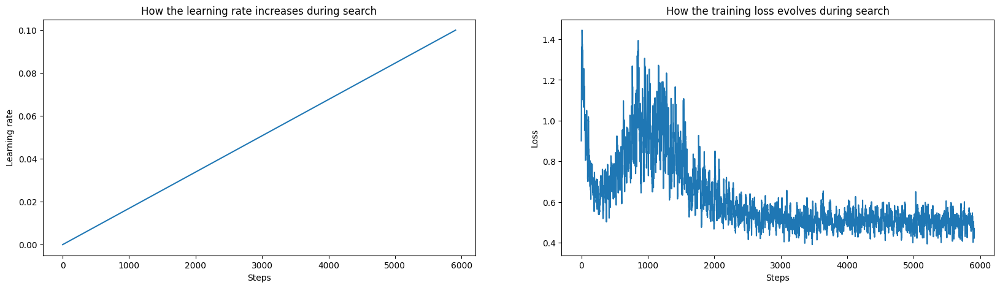

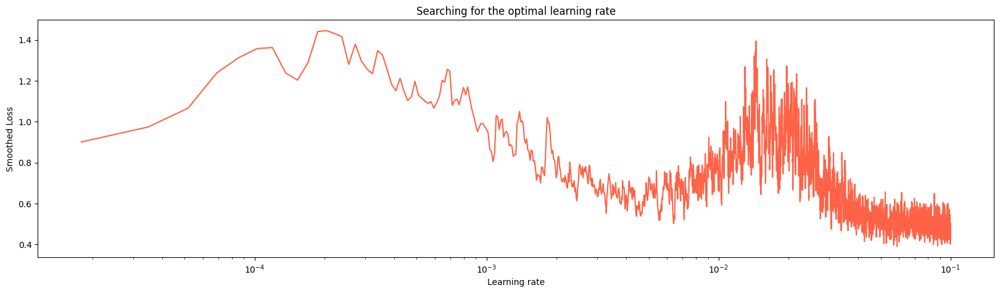

In [51]:
fig, ax = plt.subplots(1,2,figsize=(20,5))
ax[0].plot(find_lr_df.lr.values)
ax[1].plot(find_lr_df["smoothed loss"].values)
ax[0].set_xlabel("Steps")
ax[0].set_ylabel("Learning rate")
ax[1].set_xlabel("Steps")
ax[1].set_ylabel("Loss")
ax[0].set_title("How the learning rate increases during search")
ax[1].set_title("How the training loss evolves during search")

plt.figure(figsize=(20,5))
plt.plot(find_lr_df.lr.values, find_lr_df["smoothed loss"].values, '-', color="tomato")
plt.xlabel("Learning rate")
plt.xscale("log")
plt.ylabel("Smoothed Loss")
plt.title("Searching for the optimal learning rate")

In [52]:
start_lr = 1e-6
end_lr = 0.006

Perform training

In [54]:
run_training = False
if run_training:
    NUM_EPOCHS = 30
    optimizer = torch.optim.SGD(model.fc.parameters(), lr=0.01)
    scheduler = get_scheduler(optimizer, start_lr, end_lr, 2*NUM_EPOCHS)
    results = train_loop(model, criterion, optimizer, scheduler=scheduler, num_epochs = NUM_EPOCHS)
    model, loss_dict, running_loss_dict = results["model"], results["loss_dict"], results["running_loss_dict"]
    
    if device == "cpu":
        OUTPUT_PATH += ".pth"
    else:
        OUTPUT_PATH += "_cuda.pth"
        
    torch.save(model.state_dict(), OUTPUT_PATH)
    
    losses_df = pd.DataFrame(loss_dict["train"],columns=["train"])
    losses_df.loc[:, "dev"] = loss_dict["dev"]
    losses_df.loc[:, "test"] = loss_dict["test"]
    losses_df.to_csv("losses_breastcancer.csv", index=False)
    
    running_losses_df = pd.DataFrame(running_loss_dict["train"], columns=["train"])
    running_losses_df.loc[0:len(running_loss_dict["dev"])-1, "dev"] = running_loss_dict["dev"]
    running_losses_df.loc[0:len(running_loss_dict["test"])-1, "test"] = running_loss_dict["test"]
    running_losses_df.to_csv("running_losses_breastcancer.csv", index=False)
else:
    if device == "cpu":
        load_path = MODEL_PATH + ".pth"
    else:
        load_path = MODEL_PATH + "_cuda.pth"
    model.load_state_dict(torch.load(load_path, map_location='cpu'))
    model.eval()
    
    losses_df = pd.read_csv(LOSSES_PATH + "losses_breastcancer.csv")
    running_losses_df = pd.read_csv(LOSSES_PATH + "running_losses_breastcancer.csv")

Epoch 0/29
----------


  0%|          | 0/5911 [00:00<?, ?it/s]

100%|██████████| 5911/5911 [06:12<00:00, 15.88it/s, loss=0.549, accuracy=tensor(0.7518, device='cuda:0', dtype=torch.float64)]


train Loss: 0.5493 Acc: 0.7518


100%|██████████| 1273/1273 [01:34<00:00, 13.47it/s, loss=0.469, accuracy=tensor(0.7964, device='cuda:0', dtype=torch.float64)]


dev Loss: 0.4689 Acc: 0.7962


100%|██████████| 1489/1489 [01:48<00:00, 13.77it/s, loss=0.434, accuracy=tensor(0.8323, device='cuda:0', dtype=torch.float64)]


test Loss: 0.4340 Acc: 0.8328

Epoch 1/29
----------


100%|██████████| 5911/5911 [07:13<00:00, 13.63it/s, loss=0.522, accuracy=tensor(0.7656, device='cuda:0', dtype=torch.float64)]


train Loss: 0.5220 Acc: 0.7656


100%|██████████| 1273/1273 [02:20<00:00,  9.09it/s, loss=0.469, accuracy=tensor(0.7939, device='cuda:0', dtype=torch.float64)]


dev Loss: 0.4690 Acc: 0.7937


100%|██████████| 1489/1489 [02:23<00:00, 10.38it/s, loss=0.42, accuracy=tensor(0.8276, device='cuda:0', dtype=torch.float64)] 


test Loss: 0.4199 Acc: 0.8281

Epoch 2/29
----------


100%|██████████| 5911/5911 [08:02<00:00, 12.25it/s, loss=0.515, accuracy=tensor(0.7718, device='cuda:0', dtype=torch.float64)]


train Loss: 0.5153 Acc: 0.7717


100%|██████████| 1273/1273 [01:10<00:00, 18.08it/s, loss=0.456, accuracy=tensor(0.7971, device='cuda:0', dtype=torch.float64)]


dev Loss: 0.4562 Acc: 0.7969


100%|██████████| 1489/1489 [01:10<00:00, 21.09it/s, loss=0.4, accuracy=tensor(0.8310, device='cuda:0', dtype=torch.float64)]  


test Loss: 0.4001 Acc: 0.8314

Epoch 3/29
----------


100%|██████████| 5911/5911 [06:23<00:00, 15.42it/s, loss=0.512, accuracy=tensor(0.7739, device='cuda:0', dtype=torch.float64)]


train Loss: 0.5119 Acc: 0.7739


100%|██████████| 1273/1273 [02:18<00:00,  9.16it/s, loss=0.451, accuracy=tensor(0.8014, device='cuda:0', dtype=torch.float64)]


dev Loss: 0.4505 Acc: 0.8012


100%|██████████| 1489/1489 [01:39<00:00, 14.91it/s, loss=0.402, accuracy=tensor(0.8356, device='cuda:0', dtype=torch.float64)]


test Loss: 0.4023 Acc: 0.8361

Epoch 4/29
----------


100%|██████████| 5911/5911 [05:15<00:00, 18.73it/s, loss=0.508, accuracy=tensor(0.7748, device='cuda:0', dtype=torch.float64)]


train Loss: 0.5082 Acc: 0.7748


100%|██████████| 1273/1273 [01:11<00:00, 17.89it/s, loss=0.47, accuracy=tensor(0.7944, device='cuda:0', dtype=torch.float64)] 


dev Loss: 0.4700 Acc: 0.7942


100%|██████████| 1489/1489 [01:22<00:00, 18.13it/s, loss=0.416, accuracy=tensor(0.8266, device='cuda:0', dtype=torch.float64)]


test Loss: 0.4166 Acc: 0.8271

Epoch 5/29
----------


100%|██████████| 5911/5911 [04:57<00:00, 19.89it/s, loss=0.507, accuracy=tensor(0.7761, device='cuda:0', dtype=torch.float64)]


train Loss: 0.5068 Acc: 0.7761


100%|██████████| 1273/1273 [02:22<00:00,  8.93it/s, loss=0.47, accuracy=tensor(0.7940, device='cuda:0', dtype=torch.float64)] 


dev Loss: 0.4696 Acc: 0.7938


100%|██████████| 1489/1489 [01:21<00:00, 18.18it/s, loss=0.417, accuracy=tensor(0.8290, device='cuda:0', dtype=torch.float64)]


test Loss: 0.4169 Acc: 0.8295

Epoch 6/29
----------


100%|██████████| 5911/5911 [05:18<00:00, 18.58it/s, loss=0.505, accuracy=tensor(0.7780, device='cuda:0', dtype=torch.float64)]


train Loss: 0.5053 Acc: 0.7779


100%|██████████| 1273/1273 [01:35<00:00, 13.30it/s, loss=0.453, accuracy=tensor(0.7985, device='cuda:0', dtype=torch.float64)]


dev Loss: 0.4529 Acc: 0.7983


100%|██████████| 1489/1489 [02:12<00:00, 11.24it/s, loss=0.407, accuracy=tensor(0.8336, device='cuda:0', dtype=torch.float64)]


test Loss: 0.4075 Acc: 0.8341

Epoch 7/29
----------


100%|██████████| 5911/5911 [06:07<00:00, 16.07it/s, loss=0.503, accuracy=tensor(0.7782, device='cuda:0', dtype=torch.float64)]


train Loss: 0.5028 Acc: 0.7782


100%|██████████| 1273/1273 [01:15<00:00, 16.92it/s, loss=0.447, accuracy=tensor(0.8095, device='cuda:0', dtype=torch.float64)]


dev Loss: 0.4470 Acc: 0.8093


100%|██████████| 1489/1489 [01:28<00:00, 16.79it/s, loss=0.394, accuracy=tensor(0.8402, device='cuda:0', dtype=torch.float64)]


test Loss: 0.3946 Acc: 0.8407

Epoch 8/29
----------


100%|██████████| 5911/5911 [04:53<00:00, 20.15it/s, loss=0.502, accuracy=tensor(0.7794, device='cuda:0', dtype=torch.float64)]


train Loss: 0.5020 Acc: 0.7794


100%|██████████| 1273/1273 [01:04<00:00, 19.59it/s, loss=0.479, accuracy=tensor(0.7870, device='cuda:0', dtype=torch.float64)]


dev Loss: 0.4786 Acc: 0.7868


100%|██████████| 1489/1489 [01:10<00:00, 21.03it/s, loss=0.419, accuracy=tensor(0.8213, device='cuda:0', dtype=torch.float64)]


test Loss: 0.4193 Acc: 0.8218

Epoch 9/29
----------


100%|██████████| 5911/5911 [05:12<00:00, 18.89it/s, loss=0.5, accuracy=tensor(0.7807, device='cuda:0', dtype=torch.float64)]  


train Loss: 0.4997 Acc: 0.7807


100%|██████████| 1273/1273 [01:02<00:00, 20.34it/s, loss=0.453, accuracy=tensor(0.8085, device='cuda:0', dtype=torch.float64)]


dev Loss: 0.4526 Acc: 0.8083


100%|██████████| 1489/1489 [01:06<00:00, 22.31it/s, loss=0.398, accuracy=tensor(0.8409, device='cuda:0', dtype=torch.float64)]


test Loss: 0.3980 Acc: 0.8414

Epoch 10/29
----------


100%|██████████| 5911/5911 [04:41<00:00, 21.03it/s, loss=0.499, accuracy=tensor(0.7804, device='cuda:0', dtype=torch.float64)]


train Loss: 0.4985 Acc: 0.7804


100%|██████████| 1273/1273 [01:16<00:00, 16.55it/s, loss=0.44, accuracy=tensor(0.8117, device='cuda:0', dtype=torch.float64)] 


dev Loss: 0.4394 Acc: 0.8115


100%|██████████| 1489/1489 [01:36<00:00, 15.38it/s, loss=0.402, accuracy=tensor(0.8437, device='cuda:0', dtype=torch.float64)]


test Loss: 0.4022 Acc: 0.8442

Epoch 11/29
----------


100%|██████████| 5911/5911 [06:19<00:00, 15.56it/s, loss=0.498, accuracy=tensor(0.7815, device='cuda:0', dtype=torch.float64)]


train Loss: 0.4980 Acc: 0.7815


100%|██████████| 1273/1273 [01:26<00:00, 14.72it/s, loss=0.44, accuracy=tensor(0.8099, device='cuda:0', dtype=torch.float64)] 


dev Loss: 0.4397 Acc: 0.8097


100%|██████████| 1489/1489 [01:32<00:00, 16.04it/s, loss=0.387, accuracy=tensor(0.8423, device='cuda:0', dtype=torch.float64)]


test Loss: 0.3877 Acc: 0.8428

Epoch 12/29
----------


100%|██████████| 5911/5911 [07:23<00:00, 13.33it/s, loss=0.496, accuracy=tensor(0.7815, device='cuda:0', dtype=torch.float64)]


train Loss: 0.4962 Acc: 0.7815


100%|██████████| 1273/1273 [01:35<00:00, 13.33it/s, loss=0.454, accuracy=tensor(0.7995, device='cuda:0', dtype=torch.float64)]


dev Loss: 0.4539 Acc: 0.7992


100%|██████████| 1489/1489 [01:35<00:00, 15.62it/s, loss=0.41, accuracy=tensor(0.8308, device='cuda:0', dtype=torch.float64)] 


test Loss: 0.4099 Acc: 0.8313

Epoch 13/29
----------


100%|██████████| 5911/5911 [05:59<00:00, 16.45it/s, loss=0.495, accuracy=tensor(0.7833, device='cuda:0', dtype=torch.float64)]


train Loss: 0.4951 Acc: 0.7833


100%|██████████| 1273/1273 [01:22<00:00, 15.36it/s, loss=0.443, accuracy=tensor(0.8095, device='cuda:0', dtype=torch.float64)]


dev Loss: 0.4426 Acc: 0.8092


100%|██████████| 1489/1489 [01:38<00:00, 15.10it/s, loss=0.397, accuracy=tensor(0.8404, device='cuda:0', dtype=torch.float64)]


test Loss: 0.3973 Acc: 0.8409

Epoch 14/29
----------


100%|██████████| 5911/5911 [05:18<00:00, 18.59it/s, loss=0.495, accuracy=tensor(0.7834, device='cuda:0', dtype=torch.float64)]


train Loss: 0.4953 Acc: 0.7834


100%|██████████| 1273/1273 [02:20<00:00,  9.07it/s, loss=0.441, accuracy=tensor(0.8107, device='cuda:0', dtype=torch.float64)]


dev Loss: 0.4410 Acc: 0.8105


100%|██████████| 1489/1489 [02:05<00:00, 11.90it/s, loss=0.401, accuracy=tensor(0.8426, device='cuda:0', dtype=torch.float64)]


test Loss: 0.4008 Acc: 0.8430

Epoch 15/29
----------


100%|██████████| 5911/5911 [04:38<00:00, 21.19it/s, loss=0.492, accuracy=tensor(0.7852, device='cuda:0', dtype=torch.float64)]


train Loss: 0.4923 Acc: 0.7852


100%|██████████| 1273/1273 [01:09<00:00, 18.23it/s, loss=0.442, accuracy=tensor(0.8078, device='cuda:0', dtype=torch.float64)]


dev Loss: 0.4416 Acc: 0.8076


100%|██████████| 1489/1489 [01:27<00:00, 17.01it/s, loss=0.397, accuracy=tensor(0.8414, device='cuda:0', dtype=torch.float64)]


test Loss: 0.3975 Acc: 0.8419

Epoch 16/29
----------


100%|██████████| 5911/5911 [05:55<00:00, 16.61it/s, loss=0.49, accuracy=tensor(0.7861, device='cuda:0', dtype=torch.float64)] 


train Loss: 0.4899 Acc: 0.7861


100%|██████████| 1273/1273 [01:27<00:00, 14.47it/s, loss=0.464, accuracy=tensor(0.7951, device='cuda:0', dtype=torch.float64)]


dev Loss: 0.4639 Acc: 0.7949


100%|██████████| 1489/1489 [02:07<00:00, 11.66it/s, loss=0.414, accuracy=tensor(0.8296, device='cuda:0', dtype=torch.float64)]


test Loss: 0.4146 Acc: 0.8301

Epoch 17/29
----------


100%|██████████| 5911/5911 [06:05<00:00, 16.16it/s, loss=0.49, accuracy=tensor(0.7861, device='cuda:0', dtype=torch.float64)] 


train Loss: 0.4903 Acc: 0.7860


100%|██████████| 1273/1273 [01:03<00:00, 20.16it/s, loss=0.467, accuracy=tensor(0.7928, device='cuda:0', dtype=torch.float64)]


dev Loss: 0.4669 Acc: 0.7926


100%|██████████| 1489/1489 [01:19<00:00, 18.76it/s, loss=0.405, accuracy=tensor(0.8284, device='cuda:0', dtype=torch.float64)]


test Loss: 0.4054 Acc: 0.8289

Epoch 18/29
----------


100%|██████████| 5911/5911 [05:10<00:00, 19.06it/s, loss=0.49, accuracy=tensor(0.7865, device='cuda:0', dtype=torch.float64)] 


train Loss: 0.4896 Acc: 0.7865


100%|██████████| 1273/1273 [02:28<00:00,  8.56it/s, loss=0.44, accuracy=tensor(0.8095, device='cuda:0', dtype=torch.float64)] 


dev Loss: 0.4396 Acc: 0.8093


100%|██████████| 1489/1489 [02:30<00:00,  9.89it/s, loss=0.387, accuracy=tensor(0.8428, device='cuda:0', dtype=torch.float64)]


test Loss: 0.3871 Acc: 0.8433

Epoch 19/29
----------


100%|██████████| 5911/5911 [09:02<00:00, 10.90it/s, loss=0.489, accuracy=tensor(0.7858, device='cuda:0', dtype=torch.float64)]


train Loss: 0.4892 Acc: 0.7857


100%|██████████| 1273/1273 [02:26<00:00,  8.67it/s, loss=0.45, accuracy=tensor(0.8046, device='cuda:0', dtype=torch.float64)] 


dev Loss: 0.4500 Acc: 0.8044


100%|██████████| 1489/1489 [01:09<00:00, 21.39it/s, loss=0.408, accuracy=tensor(0.8354, device='cuda:0', dtype=torch.float64)]


test Loss: 0.4084 Acc: 0.8358

Epoch 20/29
----------


100%|██████████| 5911/5911 [06:08<00:00, 16.04it/s, loss=0.487, accuracy=tensor(0.7859, device='cuda:0', dtype=torch.float64)]


train Loss: 0.4869 Acc: 0.7859


100%|██████████| 1273/1273 [00:56<00:00, 22.36it/s, loss=0.472, accuracy=tensor(0.7851, device='cuda:0', dtype=torch.float64)]


dev Loss: 0.4721 Acc: 0.7849


100%|██████████| 1489/1489 [01:06<00:00, 22.28it/s, loss=0.412, accuracy=tensor(0.8211, device='cuda:0', dtype=torch.float64)]


test Loss: 0.4124 Acc: 0.8216

Epoch 21/29
----------


100%|██████████| 5911/5911 [04:21<00:00, 22.60it/s, loss=0.487, accuracy=tensor(0.7871, device='cuda:0', dtype=torch.float64)]


train Loss: 0.4867 Acc: 0.7871


100%|██████████| 1273/1273 [00:53<00:00, 23.85it/s, loss=0.455, accuracy=tensor(0.7918, device='cuda:0', dtype=torch.float64)]


dev Loss: 0.4549 Acc: 0.7916


100%|██████████| 1489/1489 [01:07<00:00, 22.07it/s, loss=0.404, accuracy=tensor(0.8261, device='cuda:0', dtype=torch.float64)]


test Loss: 0.4043 Acc: 0.8266

Epoch 22/29
----------


100%|██████████| 5911/5911 [05:02<00:00, 19.54it/s, loss=0.486, accuracy=tensor(0.7860, device='cuda:0', dtype=torch.float64)]  


train Loss: 0.4860 Acc: 0.7860


100%|██████████| 1273/1273 [00:59<00:00, 21.22it/s, loss=0.466, accuracy=tensor(0.7896, device='cuda:0', dtype=torch.float64)]


dev Loss: 0.4655 Acc: 0.7894


100%|██████████| 1489/1489 [01:11<00:00, 20.95it/s, loss=0.412, accuracy=tensor(0.8244, device='cuda:0', dtype=torch.float64)]


test Loss: 0.4119 Acc: 0.8249

Epoch 23/29
----------


100%|██████████| 5911/5911 [04:18<00:00, 22.87it/s, loss=0.485, accuracy=tensor(0.7884, device='cuda:0', dtype=torch.float64)]


train Loss: 0.4851 Acc: 0.7883


100%|██████████| 1273/1273 [00:58<00:00, 21.66it/s, loss=0.455, accuracy=tensor(0.8005, device='cuda:0', dtype=torch.float64)]


dev Loss: 0.4546 Acc: 0.8003


100%|██████████| 1489/1489 [00:59<00:00, 24.98it/s, loss=0.397, accuracy=tensor(0.8352, device='cuda:0', dtype=torch.float64)]


test Loss: 0.3968 Acc: 0.8357

Epoch 24/29
----------


100%|██████████| 5911/5911 [04:02<00:00, 24.42it/s, loss=0.484, accuracy=tensor(0.7885, device='cuda:0', dtype=torch.float64)]


train Loss: 0.4843 Acc: 0.7885


100%|██████████| 1273/1273 [00:50<00:00, 25.11it/s, loss=0.464, accuracy=tensor(0.7887, device='cuda:0', dtype=torch.float64)]


dev Loss: 0.4643 Acc: 0.7885


100%|██████████| 1489/1489 [06:36<00:00,  3.76it/s, loss=0.423, accuracy=tensor(0.8211, device='cuda:0', dtype=torch.float64)]


test Loss: 0.4236 Acc: 0.8215

Epoch 25/29
----------


100%|██████████| 5911/5911 [04:08<00:00, 23.81it/s, loss=0.484, accuracy=tensor(0.7889, device='cuda:0', dtype=torch.float64)]


train Loss: 0.4837 Acc: 0.7889


100%|██████████| 1273/1273 [00:48<00:00, 26.12it/s, loss=0.468, accuracy=tensor(0.7955, device='cuda:0', dtype=torch.float64)]


dev Loss: 0.4676 Acc: 0.7953


100%|██████████| 1489/1489 [01:03<00:00, 23.52it/s, loss=0.414, accuracy=tensor(0.8306, device='cuda:0', dtype=torch.float64)]


test Loss: 0.4143 Acc: 0.8311

Epoch 26/29
----------


100%|██████████| 5911/5911 [04:02<00:00, 24.38it/s, loss=0.483, accuracy=tensor(0.7898, device='cuda:0', dtype=torch.float64)]


train Loss: 0.4828 Acc: 0.7898


100%|██████████| 1273/1273 [00:48<00:00, 25.99it/s, loss=0.454, accuracy=tensor(0.8030, device='cuda:0', dtype=torch.float64)]


dev Loss: 0.4543 Acc: 0.8028


100%|██████████| 1489/1489 [00:58<00:00, 25.38it/s, loss=0.405, accuracy=tensor(0.8381, device='cuda:0', dtype=torch.float64)]


test Loss: 0.4054 Acc: 0.8386

Epoch 27/29
----------


100%|██████████| 5911/5911 [05:41<00:00, 17.31it/s, loss=0.484, accuracy=tensor(0.7878, device='cuda:0', dtype=torch.float64)]


train Loss: 0.4836 Acc: 0.7878


100%|██████████| 1273/1273 [02:28<00:00,  8.54it/s, loss=0.443, accuracy=tensor(0.8054, device='cuda:0', dtype=torch.float64)]


dev Loss: 0.4431 Acc: 0.8052


100%|██████████| 1489/1489 [01:21<00:00, 18.30it/s, loss=0.395, accuracy=tensor(0.8400, device='cuda:0', dtype=torch.float64)]


test Loss: 0.3953 Acc: 0.8404

Epoch 28/29
----------


100%|██████████| 5911/5911 [05:36<00:00, 17.55it/s, loss=0.483, accuracy=tensor(0.7892, device='cuda:0', dtype=torch.float64)]


train Loss: 0.4831 Acc: 0.7892


100%|██████████| 1273/1273 [01:17<00:00, 16.52it/s, loss=0.45, accuracy=tensor(0.8017, device='cuda:0', dtype=torch.float64)] 


dev Loss: 0.4501 Acc: 0.8015


100%|██████████| 1489/1489 [01:23<00:00, 17.73it/s, loss=0.409, accuracy=tensor(0.8367, device='cuda:0', dtype=torch.float64)]


test Loss: 0.4096 Acc: 0.8372

Epoch 29/29
----------


100%|██████████| 5911/5911 [05:03<00:00, 19.50it/s, loss=0.481, accuracy=tensor(0.7911, device='cuda:0', dtype=torch.float64)]


train Loss: 0.4806 Acc: 0.7911


100%|██████████| 1273/1273 [00:52<00:00, 24.27it/s, loss=0.463, accuracy=tensor(0.8093, device='cuda:0', dtype=torch.float64)]


dev Loss: 0.4631 Acc: 0.8091


100%|██████████| 1489/1489 [01:01<00:00, 24.21it/s, loss=0.424, accuracy=tensor(0.8438, device='cuda:0', dtype=torch.float64)]


test Loss: 0.4243 Acc: 0.8443

Training complete in 261m 47s
Best val Acc: 0.811520


# Result Analysis 

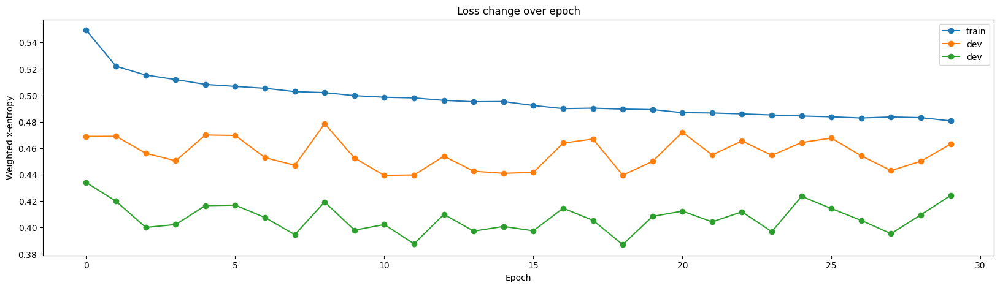

In [55]:
plt.figure(figsize=(20,5))
plt.plot(losses_df["train"], '-o', label="train")
plt.plot(losses_df["dev"], '-o', label="dev")
plt.plot(losses_df["test"], '-o', label="dev")
plt.xlabel("Epoch")
plt.ylabel("Weighted x-entropy")
plt.title("Loss change over epoch")
plt.legend()

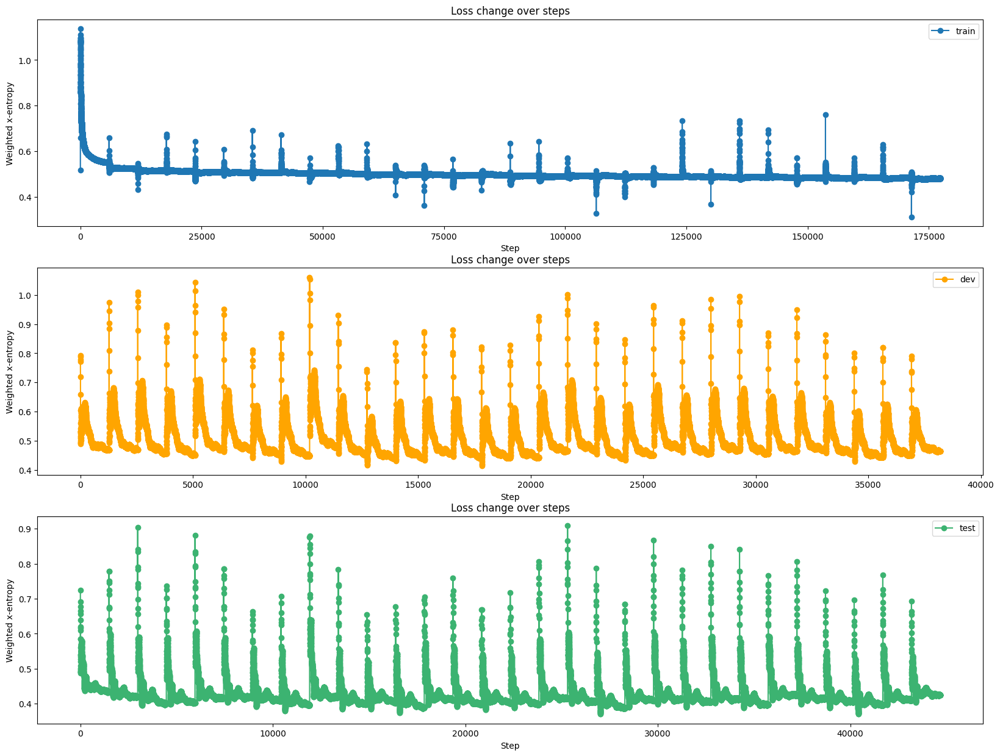

In [56]:
fig, ax = plt.subplots(3,1,figsize=(20,15))

ax[0].plot(running_losses_df["train"], '-o', label="train")
ax[0].set_xlabel("Step")
ax[0].set_ylabel("Weighted x-entropy")
ax[0].set_title("Loss change over steps")
ax[0].legend()

ax[1].plot(running_losses_df["dev"], '-o', label="dev", color="orange")
ax[1].set_xlabel("Step")
ax[1].set_ylabel("Weighted x-entropy")
ax[1].set_title("Loss change over steps")
ax[1].legend()

ax[2].plot(running_losses_df["test"], '-o', label="test", color="mediumseagreen")
ax[2].set_xlabel("Step")
ax[2].set_ylabel("Weighted x-entropy")
ax[2].set_title("Loss change over steps")
ax[2].legend()

# Probablity of portion containing IDC 

In [59]:
def sigmoid(x):
    return 1./(1+np.exp(-x))

def evaluate_model(model, predictions_df, key):
    was_training = model.training
    model.eval()

    with torch.no_grad():
        for i, data in enumerate(dataloaders[key]):
            inputs = data["image"].to(device)
            labels = data["label"].to(device)
            
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            
            proba = outputs.cpu().numpy().astype(np.float_)
            predictions_df.loc[i*BATCH_SIZE:(i+1)*BATCH_SIZE-1, "proba"] = sigmoid(proba[:, 1])
            predictions_df.loc[i*BATCH_SIZE:(i+1)*BATCH_SIZE-1, "true"] = data["label"].numpy().astype(int)
            predictions_df.loc[i*BATCH_SIZE:(i+1)*BATCH_SIZE-1, "predicted"] = preds.cpu().numpy().astype(int)
            predictions_df.loc[i*BATCH_SIZE:(i+1)*BATCH_SIZE-1, "x"] = data["x"].numpy()
            predictions_df.loc[i*BATCH_SIZE:(i+1)*BATCH_SIZE-1, "y"] = data["y"].numpy()
            predictions_df.loc[i*BATCH_SIZE:(i+1)*BATCH_SIZE-1, "patient_id"] = data["patient_id"]
            
    predictions_df = predictions_df.dropna()
    return predictions_df

In [60]:
if run_training:
    dev_predictions = pd.DataFrame(index = np.arange(0, dataset_sizes["dev"]), columns = ["true", "predicted", "proba"])
    test_predictions = pd.DataFrame(index = np.arange(0, dataset_sizes["test"]), columns = ["true", "predicted", "proba"])

    dev_predictions = evaluate_model(model, dev_predictions, "dev")
    test_predictions = evaluate_model(model, test_predictions, "test")
    
    dev_predictions.to_csv("dev_predictions.csv", index=False)
    test_predictions.to_csv("test_predictions.csv", index=False)
    
else:
    
    dev_predictions = pd.read_csv(LOSSES_PATH + "dev_predictions.csv")
    test_predictions = pd.read_csv(LOSSES_PATH + "test_predictions.csv")
    
    dev_predictions.patient_id = dev_predictions.patient_id.astype(np.str_)

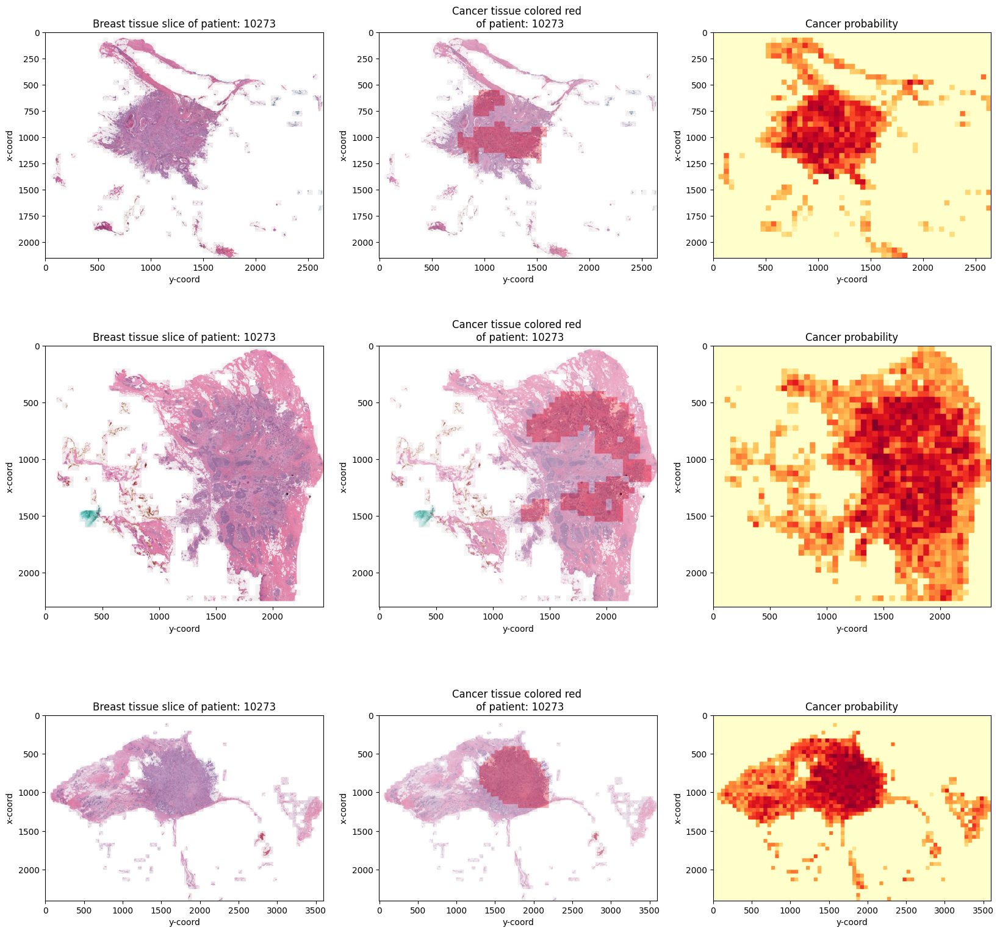

In [67]:
fig, ax = plt.subplots(3,3,figsize=(20,20))

for n in range(3):

    idx = dev_predictions.patient_id.unique()[n]
    grid, mask, broken_patches, mask_proba = visualise_breast_tissue(idx, pred_df=dev_predictions)


    ax[n, 0].imshow(grid, alpha=0.9)
    ax[n, 1].imshow(mask, alpha=0.8)
    ax[n, 1].imshow(grid, alpha=0.7)
    ax[n, 2].imshow(mask_proba[:,:,0], cmap="YlOrRd")

    for m in range(3):
        ax[n, m].set_xlabel("y-coord")
        ax[n, m].set_ylabel("x-coord")
        ax[n, m].grid(False)
        
    ax[n, 0].set_title("Breast tissue slice of patient: " + patient_id)
    ax[n, 1].set_title("Cancer tissue colored red \n of patient: " + patient_id)
    ax[n, 2].set_title("Cancer probability")

In [68]:
dev_predictions.head()

,true,predicted,proba,x,y,patient_id
0,0,0,0.163047,1001.0,101.0,10258
1,0,1,0.764709,1001.0,1151.0,10258
2,0,1,0.622952,1001.0,1201.0,10258
3,0,1,0.688057,1001.0,1251.0,10258
4,0,1,0.611433,1001.0,1301.0,10258


C:\Users\rsurs\AppData\Local\Temp\ipykernel_18964\2974907004.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=dev_predictions['true'].astype(np.float64), ax=ax[0], palette="Reds_r")


Text(0.5, 1.0, 'Predicted probability of cancer in test')

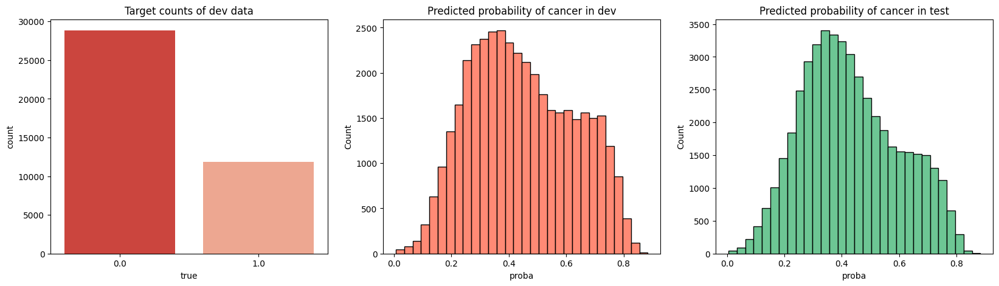

In [69]:
fig, ax = plt.subplots(1, 3, figsize=(20, 5))

sns.countplot(x=dev_predictions['true'].astype(np.float64), ax=ax[0], palette="Reds_r")
ax[0].set_title("Target counts of dev data")

sns.histplot(x=dev_predictions['proba'].astype(np.float64), ax=ax[1], kde=False, color="tomato", bins=30)
ax[1].set_title("Predicted probability of cancer in dev")

sns.histplot(x=test_predictions['proba'].astype(np.float64), ax=ax[2], kde=False, color="mediumseagreen", bins=30)
ax[2].set_title("Predicted probability of cancer in test")

# Confusion matrix

In [70]:
from sklearn.metrics import confusion_matrix

def get_confusion_matrix(y_true, y_pred):
    transdict = {1: "cancer", 0: "no cancer"}
    y_t = np.array([transdict[x] for x in y_true])
    y_p = np.array([transdict[x] for x in y_pred])
    
    labels = ["no cancer", "cancer"]
    index_labels = ["actual no cancer", "actual cancer"]
    col_labels = ["predicted no cancer", "predicted cancer"]
    confusion = confusion_matrix(y_t, y_p, labels=labels)
    confusion_df = pd.DataFrame(confusion, index=index_labels, columns=col_labels)
    for n in range(2):
        confusion_df.iloc[n] = confusion_df.iloc[n] / confusion_df.sum(axis=1).iloc[n]
    return confusion_df

In [72]:
conf_dev_df = get_confusion_matrix(dev_predictions['true'],dev_predictions['predicted'])
conf_dev_df

C:\Users\rsurs\AppData\Local\Temp\ipykernel_18964\630074875.py:14: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.8425669116627374' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  confusion_df.iloc[n] = confusion_df.iloc[n] / confusion_df.sum(axis=1).iloc[n]
C:\Users\rsurs\AppData\Local\Temp\ipykernel_18964\630074875.py:14: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.15743308833726252' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  confusion_df.iloc[n] = confusion_df.iloc[n] / confusion_df.sum(axis=1).iloc[n]


,predicted no cancer,predicted cancer
actual no cancer,0.842567,0.157433
actual cancer,0.263034,0.736966


In [71]:
conf_test_df = get_confusion_matrix(test_predictions['true'],test_predictions['predicted'])
conf_test_df

C:\Users\rsurs\AppData\Local\Temp\ipykernel_18964\630074875.py:14: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.9022567366362071' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  confusion_df.iloc[n] = confusion_df.iloc[n] / confusion_df.sum(axis=1).iloc[n]
C:\Users\rsurs\AppData\Local\Temp\ipykernel_18964\630074875.py:14: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.09774326336379295' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  confusion_df.iloc[n] = confusion_df.iloc[n] / confusion_df.sum(axis=1).iloc[n]


,predicted no cancer,predicted cancer
actual no cancer,0.902257,0.097743
actual cancer,0.304533,0.695467
